In [116]:
import pandas as pd
import warnings
import re
import nltk
import plotly.express as px
from nltk.corpus import stopwords
from gensim import corpora, models
import gensim
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [92]:
amz = pd.read_excel('/content/drive/MyDrive/Amazon.xlsx')

In [93]:
amz.astype({'Tweet content': 'string', 'Tweet language': 'string', 'Company Name': 'string'}).dtypes

Date              datetime64[ns]
Tweet content             string
Tweet language            string
Is a RT                     bool
Company Name              string
dtype: object

In [94]:
def remove_emojis(data):
    emoj = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642"
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030"
                      "]+", re.UNICODE)
    return re.sub(emoj, '', data)

In [95]:
def preprocess_tweet(tweet):
    # Remove URLs
    tweet = re.sub(r'http\S+|www\S+|https\S+', '', tweet)

    # Remove user mentions
    tweet = re.sub(r'@[^\s]+', '', tweet)

    # Remove special characters, punctuation, and numbers
    tweet = re.sub(r'[^a-zA-Z\s]', '', tweet)

    # Remove retweet indicators
    tweet = re.sub(r'\brt\b', '', tweet)

    # Remove emojis
    tweet = remove_emojis(tweet)

    # Convert data to lowercase
    tweet = tweet.lower()

    # Removing stopwords
    clean_words = [word for word in tweet.split() if word.lower() not in stopwords.words('english')]

    return ' '.join(clean_words)

In [96]:
# Word tokenization
def word_tokenization(tweet):
    # Tokenization
    words = nltk.word_tokenize(tweet)
    return words

In [97]:
# Create a new DataFrame for the cleaned tweet content
amz_1 = pd.DataFrame()

# Create a new DataFrame by copying the columns you want from the original DataFrame
amz_1 = amz[['Date', 'Tweet language', 'Is a RT', 'Company Name']].copy()

In [98]:
# Apply preprocessing and tokenization
amz_1['Tweet content'] = amz['Tweet content']
amz_1['Tweet content'] = amz_1['Tweet content'].apply(preprocess_tweet)
amz_1['Tweet content'] = amz_1['Tweet content'].apply(word_tokenization)

In [99]:
# Conversion of data types
amz_1 = amz_1.astype({'Tweet content': 'string', 'Tweet language': 'string', 'Company Name': 'string'})

Date              datetime64[ns]
Tweet language            string
Is a RT                     bool
Company Name              string
Tweet content             string
dtype: object


In [100]:
amz_1['Tweet content']

0        ['try', 'discovery', 'engine', 'amp', 'social'...
1        ['andreas', 'halvorsen', 'buys', 'facebook', '...
2        ['rt', 'stocks', 'surprise', 'investors', 'ear...
3        ['oneplus', 'launched', 'price', 'rs', 'availa...
4        ['ocado', 'shares', 'plummet', 'amazon', 'fres...
                               ...                        
38187    ['amazons', 'tick', 'reboot', 'aims', 'stand',...
38188    ['swear', 'momos', 'watching', 'trades', 'ever...
38189                            ['amzn', 'wants', 'roll']
38190    ['five', 'minute', 'trades', 'spy', 'dia', 'qq...
38191    ['rt', 'walls', 'cupboards', 'browsers', 'app'...
Name: Tweet content, Length: 38192, dtype: string

In [101]:
# Extracting the text from the 'Tweet content' column
tweet_texts = amz_1['Tweet content'].dropna().tolist()  # Drops any NaN values and convert to list

# Tokenizing the text and converting to lowercase
words = [word.lower() for text in tweet_texts for word in re.findall(r'\b\w+\b', text)]

# Counting the frequency of each word
word_counts = Counter(words)

# Getting the most common 50 words
top_50_words = word_counts.most_common(50)

# Displaying the results
for word, count in top_50_words:
    print(f'{word}: {count}')

amzn: 38713
amazon: 8527
rt: 7548
fb: 6965
aapl: 6908
nflx: 4410
read: 3853
goog: 3777
spy: 3586
googl: 3112
tsla: 3027
msft: 2703
qqq: 2627
stocks: 2463
twtr: 2120
new: 2008
stock: 1834
inc: 1756
buy: 1544
amp: 1489
earnings: 1445
spx: 1401
market: 1160
video: 1134
via: 1123
trading: 1122
sell: 1076
day: 1060
amazons: 1027
iwm: 1007
today: 989
prime: 968
baba: 960
see: 949
wmt: 948
apple: 931
like: 878
cloud: 854
tech: 852
bezos: 828
pt: 827
top: 823
retail: 817
may: 816
dia: 786
lnkd: 780
short: 746
trade: 739
ibm: 738
week: 737


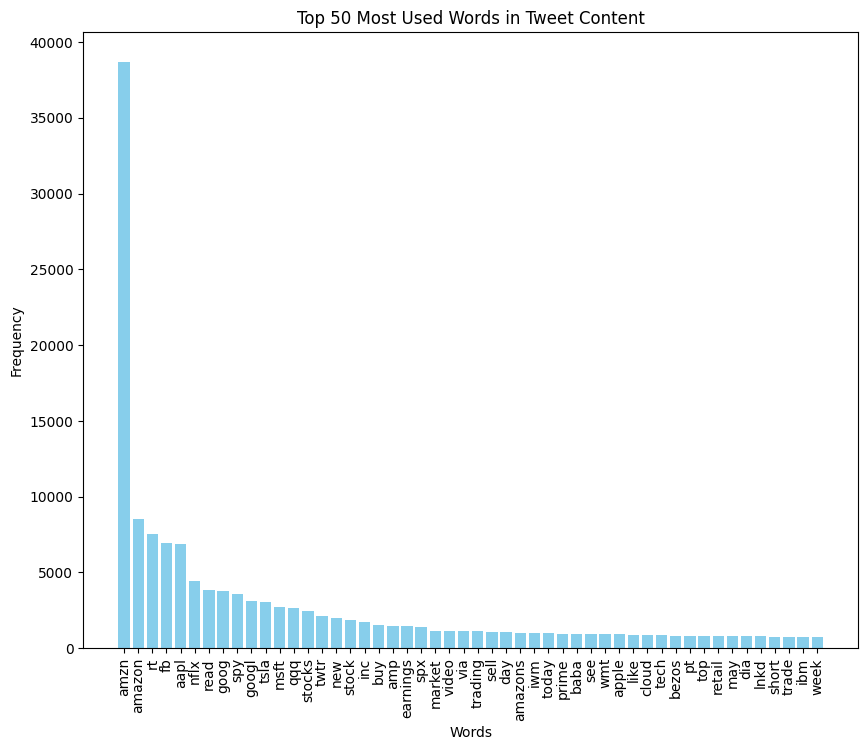

In [102]:
import matplotlib.pyplot as plt

# Continuing from the previous code block...
top_50_words = word_counts.most_common(50)

# Preparing data for plotting
words, frequencies = zip(*top_50_words)  # Unzipping the words and their counts

# Plotting
plt.figure(figsize=(10, 8))  # Set the figure size for better readability
plt.bar(words, frequencies, color='blue')  # Create a bar chart
plt.xlabel('Words')  # Label for the x-axis
plt.ylabel('Frequency')  # Label for the y-axis
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.title('Top 50 Most Used Words in Tweet Content')  # Chart title
plt.show()

 For semantic analysis:
 -  'stocks', 'stock', 'earnings', 'market', 'trading', 'trade', 'short', maybe relevant for financial analysis,
 - Words that are too common or generic may not add much value to understanding specific topics. For instance, 'new', 'buy', 'sell', 'day', 'today', 'see', 'like', 'top', 'may', and 'week'.
 - Words like 'via' and 'amp' (which is often used in place of '&') are generally not useful in topic modeling.
 - Words like 'rt' (retweet), 'read', and 'video' might be more about the format or action related to the content rather than the content itself.
 - While 'amzn', 'fb', 'aapl', 'nflx', 'goog', 'googl', 'tsla', 'msft', 'qqq', 'twtr', 'spx', 'iwm', 'baba', 'wmt', 'apple', 'bezos', 'dia', 'lnkd', 'ibm' are relevant for financial or stock market-related discussions.
 - Words such as 'inc' (incorporated), which could be part of many company names, don't add much to the semantic content. 'Prime' might refer to Amazon Prime specifically but could be considered too specific for the topic model focuses on Amazon services.

In [106]:
# Improved list of words to remove, ensuring lowercase for comparison
words_to_remove = ['new', 'buy', 'sell', 'day', 'today', 'see', 'like', 'top', 'may', 'week',
                   'via', 'amp', 'rt', 'read', 'video', 'pt', 'next', 'time', 'c']

# Enhanced function to remove specified words from a text
def remove_words(text, remove_list):
    # Creating a pattern that matches any of the words to remove
    pattern = r'\b(' + '|'.join(remove_list) + r')\b'
    # Replacing matched words with nothing (i.e., removing them), case-insensitive
    cleaned_text = re.sub(pattern, '', text, flags=re.IGNORECASE)
    # Removing extra spaces that may be left after word removal
    cleaned_text = re.sub(r'\s+', ' ', cleaned_text).strip()
    return cleaned_text

In [107]:
# Applying the function to each tweet in the 'Tweet content' column
amz_1['Tweet content'] = amz_1['Tweet content'].apply(lambda text: remove_words(text, words_to_remove))

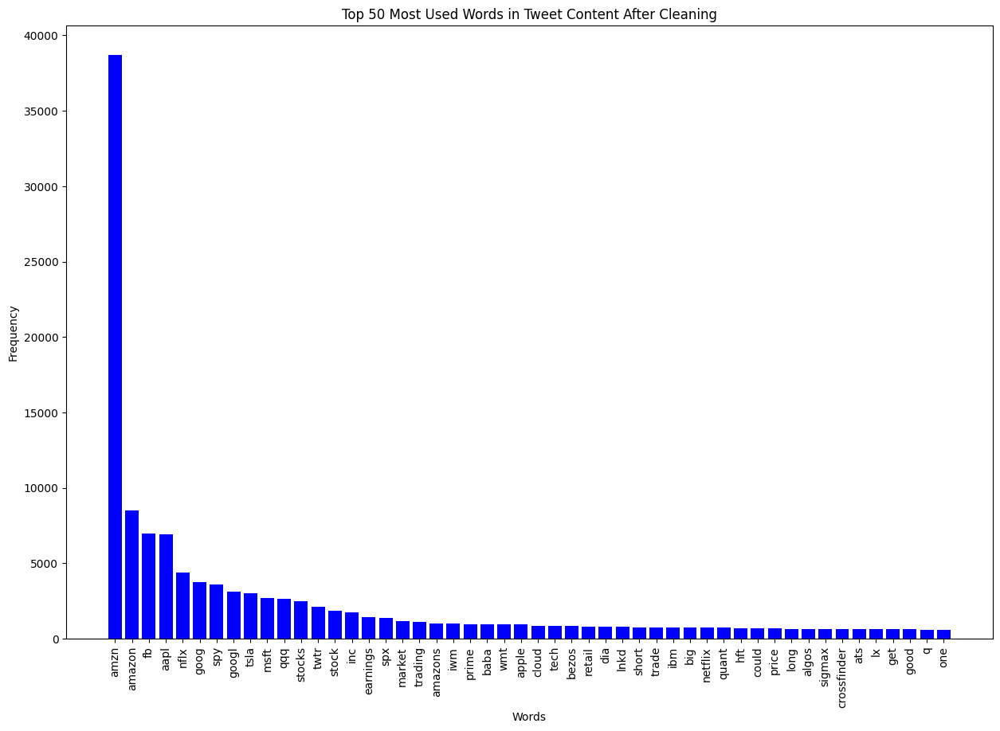

In [108]:
# Extracting text and tokenizing
all_words = [word.lower() for tweet in amz_1['Tweet content'].dropna() for word in re.findall(r'\b\w+\b', tweet)]
word_counts = Counter(all_words)

# Getting the most common 50 words
top_50_words = word_counts.most_common(50)

# Preparing data for plotting
words, frequencies = zip(*top_50_words)

# Plotting
plt.figure(figsize=(15, 10))
plt.bar(words, frequencies, color='blue')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.title('Top 50 Most Used Words in Tweet Content After Cleaning')
plt.show()

- Q is a former Nasdaq designation that noted a company had filed for bankruptcy.

In [109]:
# Convert the data type
amz_1.astype({'Tweet content': 'string', 'Tweet language': 'string', 'Company Name': 'string'}).dtypes

# Corrected code snippet
amz_1 = amz_1.astype({'Tweet content': 'string', 'Tweet language': 'string', 'Company Name': 'string'})

# Now, if you check the data types, they should be updated as expected
print(amz_1.dtypes)


Date              datetime64[ns]
Tweet language            string
Is a RT                     bool
Company Name              string
Tweet content             string
dtype: object


In [110]:
amz_1.head()

,Date,Tweet language,Is a RT,Company Name,Tweet content
0,2016-06-15 09:45:00,en,False,Amazon,"['try', 'discovery', 'engine', '', 'social', '..."
1,2016-06-15 09:35:00,en,False,Amazon,"['andreas', 'halvorsen', 'buys', 'facebook', '..."
2,2016-06-15 09:26:00,en,True,Amazon,"['', 'stocks', 'surprise', 'investors', 'earni..."
3,2016-06-15 09:21:00,en,False,Amazon,"['oneplus', 'launched', 'price', 'rs', 'availa..."
4,2016-06-15 08:53:00,en,False,Amazon,"['ocado', 'shares', 'plummet', 'amazon', 'fres..."


These words seem to be related to technology, finance, and commerce, particularly focusing on companies like Amazon, Netflix, and Google, as well as terms related to trading such as "quant," "hft" (high-frequency trading), "price," "shares," "stock," and "market." There are also terms related to Amazon's services like "prime" and "aws" (Amazon Web Services).

In [141]:
# Preprocess the text again for LDA
def preprocess(text):
    text = re.sub(r'[^a-zA-Z\s]', '', text, re.I|re.A)
    tokens = text.lower().split()
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words]
    return tokens

# Applying preprocessing to each tweet and creating a list of token lists
processed_tweets = [preprocess(tweet) for tweet in amz_1['Tweet content'].dropna()]

# Creating Dictionary and Corpus with the processed tokens
dictionary = corpora.Dictionary(processed_tweets)
corpus = [dictionary.doc2bow(tweet) for tweet in processed_tweets]

In [142]:
# Apply LDA
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=10, id2word=dictionary, passes=15)

In [143]:
# View Topics
topics = ldamodel.print_topics(num_words=4)
for topic in topics:
    print(topic)

(0, '0.161*"amzn" + 0.041*"amazon" + 0.031*"inc" + 0.024*"button"')
(1, '0.145*"amzn" + 0.143*"amazon" + 0.038*"prime" + 0.024*"netflix"')
(2, '0.079*"aapl" + 0.076*"fb" + 0.070*"amzn" + 0.056*"goog"')
(3, '0.085*"amzn" + 0.058*"amazon" + 0.042*"apple" + 0.023*"google"')
(4, '0.086*"amzn" + 0.027*"ibm" + 0.024*"fb" + 0.017*"cloud"')
(5, '0.063*"amzn" + 0.024*"fit" + 0.021*"retail" + 0.016*"wall"')
(6, '0.094*"amzn" + 0.027*"stock" + 0.024*"algos" + 0.014*"earnings"')
(7, '0.144*"amzn" + 0.031*"call" + 0.024*"short" + 0.023*"long"')
(8, '0.111*"amzn" + 0.034*"target" + 0.032*"price" + 0.022*"analyst"')
(9, '0.122*"amzn" + 0.053*"amazon" + 0.016*"one" + 0.015*"coming"')


In [144]:
# Extract topics with words and their weights
topics_data = []

for num, topic in ldamodel.show_topics(num_topics=10, num_words=4, formatted=False):
    for word, weight in topic:
        topics_data.append([f'Topic {num}', word, weight])

# Create a DataFrame
df_topics = pd.DataFrame(topics_data, columns=['Topic', 'Word', 'Weight'])

In [145]:
# Display the DataFrame to check
print(df_topics.head())

     Topic    Word    Weight
0  Topic 0    amzn  0.161102
1  Topic 0  amazon  0.041479
2  Topic 0     inc  0.030679
3  Topic 0  button  0.023845
4  Topic 1    amzn  0.144505


In [146]:
# Bar Plot for each topic showing word weights
fig = px.bar(df_topics, x='Word', y='Weight', color='Topic', title='LDA Topic Modeling: Word Weights by Topic',
             facet_col='Topic', facet_col_wrap=4, height=800)

fig.show()

Topic 2 has earning calls
Topic 3 has

In [147]:
# Scatter Plot for visualizing word weights in topics
fig = px.scatter(df_topics, x='Word', y='Topic', size='Weight', color='Topic',
                 title='LDA Topic Modeling: Word Weights by Topic', height=800)

fig.update_traces(marker=dict(opacity=0.7), selector=dict(mode='markers'))

fig.show()

In [ ]:
# Download VADER lexicon if not already downloaded
nltk.download('vader_lexicon')

# Initialize the VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Function to get sentiment scores
def get_sentiment_score(words):
    # Join the list of words into a single string
    sentence = ' '.join(words)
    # Get the polarity scores for the sentence
    sentiment_scores = sid.polarity_scores(sentence)
    # Return the compound score which represents the overall sentiment
    return sentiment_scores['compound']

# Add a new column for sentiment scores in the DataFrame
amz_1['Sentiment Score'] = amz_1['Tweet content'].apply(get_sentiment_score)

# Function to categorize sentiment
def categorize_sentiment(score):
    if score >= 0.05:
        return 'Positive'
    elif score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Add a new column for sentiment categories in the DataFrame
amz_1['Sentiment'] = amz_1['Sentiment Score'].apply(categorize_sentiment)

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [ ]:
import yfinance as yf

# Define the ticker symbol for Amazon
ticker_symbol = 'AMZN'

# Define the start and end dates
start_date = '2016-04-25'
end_date = '2016-06-15'

# Fetch the data from Yahoo Finance
amz_stock_data = yf.download(ticker_symbol, start=start_date, end=end_date)

[*********************100%%**********************]  1 of 1 completed


In [ ]:
def plot_daily_avg_sentiment(daily_avg_sentiment):
    # Calculate daily average sentiment score
    daily_avg_sentiment['Date'] = daily_avg_sentiment['Date'].dt.date
    daily_avg_sentiment = daily_avg_sentiment.groupby('Date')['Sentiment Score'].mean().reset_index()

    # Plot the daily average sentiment score
    fig = px.line(daily_avg_sentiment, x='Date', y='Sentiment Score',
                  title='Daily Average Sentiment Score Over Time',
                  labels={'Sentiment Score': 'Average Sentiment Score', 'Date': 'Date'})
    fig.update_layout(xaxis_tickangle=-45, xaxis=dict(tickformat='%Y-%m-%d'), yaxis=dict(gridcolor='lightgrey'))
    fig.show()

In [ ]:
amz_1.info()

<class 'pandas.core.series.Series'>
Index: 7 entries, Date to Sentiment
Series name: None
Non-Null Count  Dtype 
--------------  ----- 
7 non-null      object
dtypes: object(1)
memory usage: 412.0+ bytes


In [ ]:
amz_1 = amz_1.astype({'Date' : 'datetime64[ns]'}).dtypes

In [ ]:
amz_1 = amz_1.astype({'Date': 'datetime64[ns]', 'Tweet content': 'string', 'Tweet language': 'string', 'Company Name': 'string'})

KeyError: 'Only the Series name can be used for the key in Series dtype mappings.'

In [ ]:
# Filter rows between June 7, 2016, and June 12, 2016 to see how many rows exist
filtered_amz_1 = amz_1[(amz_1['Date'] >= '2016-06-07') & (amz_1['Date'] <= '2016-06-12')]

# Group by date and count the number of rows for each date
daily_counts = filtered_amz_1.groupby(filtered_amz_1['Date'].dt.date).size()

# Print the daily counts
print(daily_counts)

Date
2016-06-07     87
2016-06-12    156
dtype: int64


In [ ]:
# Reset index to make 'Date' a column instead of index
amz_stock_data = amz_stock_data.reset_index()

# Create the line chart using Plotly Express
fig = px.line(amz_stock_data, x='Date', y='Close', title='Amazon Closing Prices',
              labels={'Date': 'Date', 'Close': 'Close Price'})
fig.show()

In [ ]:
# Create a new DataFrame for the cleaned tweet content
amz_2 = pd.DataFrame()

# Create a new DataFrame by copying the columns you want from the original DataFrame
amz_2 = amz[['Date', 'Tweet language', 'Is a RT', 'Company Name']].copy()

# Apply preprocessing
amz_2['Tweet content'] = amz['Tweet content'].apply(preprocess_tweet)

In [ ]:
from transformers import BertTokenizer

# Load pre-trained BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Function to tokenize a single text
def tokenize_text(text):
    tokens = tokenizer.tokenize(text)
    return tokens

# Assuming your DataFrame is named 'amz_2' and contains a column named 'Tweet content'
amz_2['Tokenized content'] = amz_2['Tweet content'].apply(tokenize_text)

# Print tokenized content of the first few entries
print(amz_2[['Tweet content', 'Tokenized content']].head())

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning:


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.



tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

                                       Tweet content  \
0  try discovery engine amp social network invest...   
1  andreas halvorsen buys facebook amazon masterc...   
2  rt stocks surprise investors earnings season a...   
3  oneplus launched price rs available amazon rea...   
4  ocado shares plummet amazon fresh launches rea...   

                                   Tokenized content  
0  [try, discovery, engine, amp, social, network,...  
1  [andreas, hal, ##vor, ##sen, buys, facebook, a...  
2  [rt, stocks, surprise, investors, earnings, se...  
3  [one, ##pl, ##us, launched, price, rs, availab...  
4  [o, ##ca, ##do, shares, plum, ##met, amazon, f...  


In [ ]:
amz_2.head()

In [ ]:
# Add a new column for sentiment scores in the DataFrame
amz_2['Sentiment Score'] = amz_2['Tokenized content'].apply(get_sentiment_score)

# Add a new column for sentiment categories in the DataFrame
amz_2['Sentiment'] = amz_2['Sentiment Score'].apply(categorize_sentiment)

In [ ]:
# Group the data frame by 'Date' and calculate the mean sentiment score
amz_3 = amz_2.groupby('Date')['Sentiment Score'].mean().reset_index()

In [ ]:
date_column = 'Date'
score_column = 'Sentiment Score'
amz_3_sorted = amz_3.sort_values(by=date_column)

# Calculate daily average of sentiment scores
daily_avg_sentiment = amz_3_sorted.groupby(pd.Grouper(key=date_column, freq='D'))[score_column].mean().reset_index()

# Plot the daily average sentiment scores using Plotly Express
fig = px.line(daily_avg_sentiment, x=date_column, y=score_column, title='Daily Average Sentiment Scores')
fig.show()

In [ ]:
# Extract topic weights and topics from the LDA model
topic_weights = []
topics = []
for row_list in lda_model[corpus]:
    topic_weights.append([w[1] for w in row_list])
    topics.append([w[0] for w in row_list])

# Convert topic weights and topics to a DataFrame
df_topic_weights = pd.DataFrame(topic_weights, columns=[f"Topic_{i}" for i in range(lda_model.num_topics)])
df_topics = pd.DataFrame(topics, columns=[f"Topic_{i}_word" for i in range(lda_model.num_topics)])

# Combine topics and weights
df_combined = pd.concat([df_topics, df_topic_weights], axis=1)

# Plot histogram using Plotly Express
fig = px.histogram(df_combined.melt(var_name='Topic', value_name='Weight'), x='Weight', color='Topic', barmode='overlay', title='Topic Weights Distribution')
fig.show()

In [ ]:
import plotly.graph_objects as go

# Create subplots
fig = make_subplots(rows=2, cols=2, subplot_titles=[f"Topic {i}" for i in range(1, 5)])

# Plot histograms for each topic
for i in range(lda_model.num_topics):
    row = (i // 2) + 1
    col = (i % 2) + 1
    fig.add_trace(
        go.Histogram(x=df_topic_weights[f"Topic_{i}"], name=f"Topic_{i}"),
        row=row, col=col
    )

# Update layout
fig.update_layout(title_text="Topic Weights Distribution", showlegend=False)

# Show plot
fig.show()

NameError: name 'make_subplots' is not defined